In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
from scipy.special import sph_harm
from IPython.display import Image, display
import IPython.display as disp

from matplotlib import cm
import matplotlib.pyplot as plt
from scipy.misc import imread
from IPython.html.widgets import interact,fixed,Checkbox#,TextWidget
import dm_funcs as dm
imshow_kwargs={'interpolation': 'nearest', 'origin': 'lower', 'cmap': cm.spectral,'extent':[-1,1,-1,1]}

from astropy.cosmology import FlatLambdaCDM

/Users/jzorrilla/Programs/anaconda/lib/python2.7/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


In [2]:
from IPython.core.display import HTML
HTML("""
<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style>
""")

# 1. Dark Matter

## 1.1 Evidence for the existence of Dark Matter

### 1.1.1 Galactic disk

Even though there have been speculation on the existence of matter in the universe we cannot see, probably the first person to make a quantitative estimate was Jan Oort in 1932

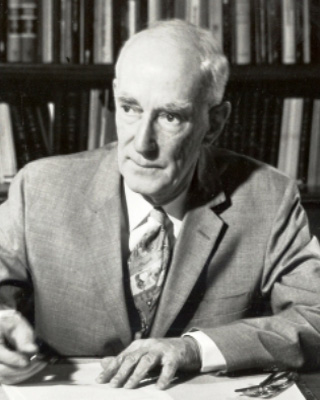

In [3]:
Image(filename="jan-hendrik-oort.jpg")

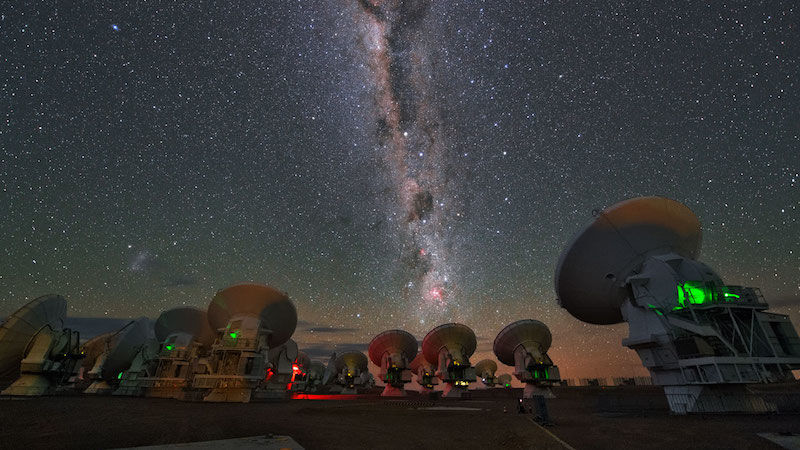

In [4]:
Image(filename="milkyway_1.jpg")

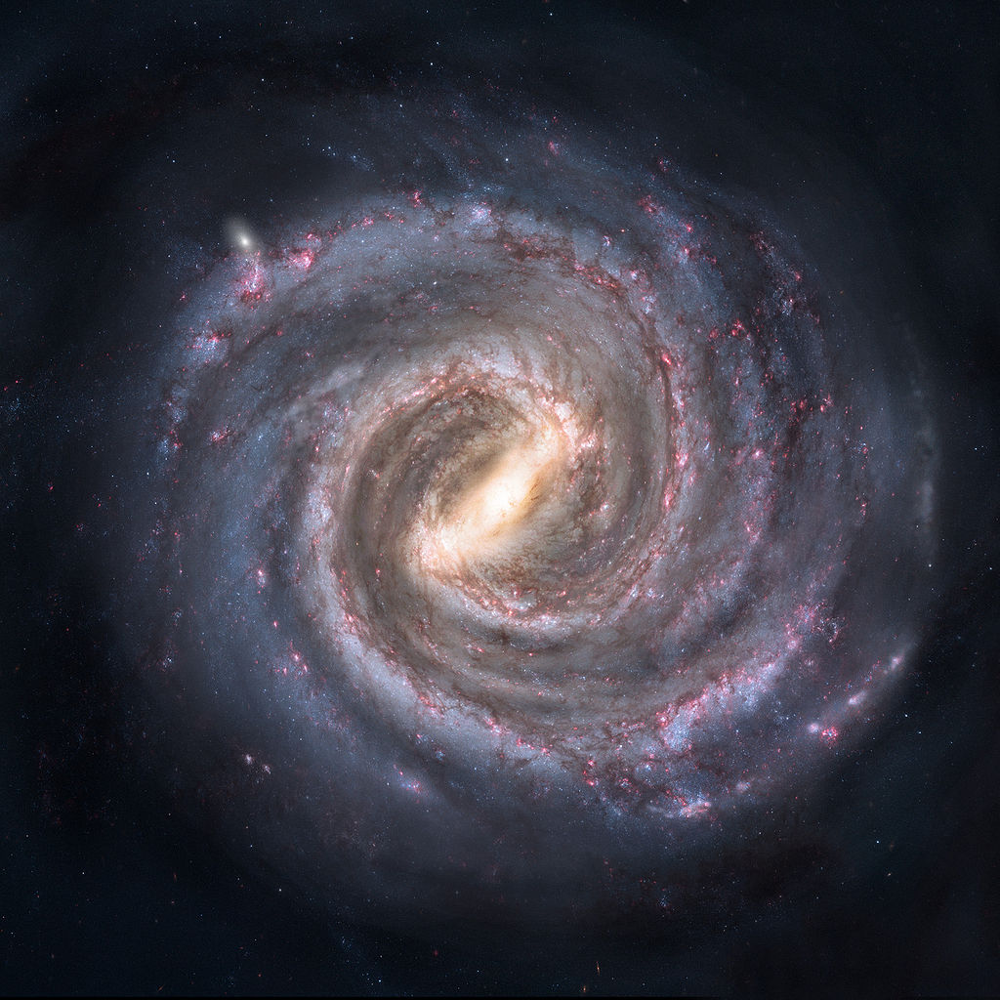

In [5]:
Image(filename="milky_way_2.jpg")

The idea behind Oort's method is that the number density of stars in a disk, as a function of height, is linked to the velocity distribution by the accelerations that the stars are subjected to, i.e. by the total mass of the disk (remember, the only force acting on the stars is gravity).

To ilustrate this let's use a toy model. Think of the gravitational field generated by an infinite plane of surface mass density $\sigma$, using Gauss' theorem:

$$\oint_{\partial V} \vec{g} \cdot \vec{dA} = -4 \pi G M$$

we obtain that the acceleration is a constant that depends solely on the mass of the disk:

$$\ddot{z}=-2 \pi G \sigma$$


The trajectory of a particle that only moves along the z axis is very simple then:

$$\dot{z} = -2 \pi G \sigma t + \dot{z_0}$$

$$z = -\pi G t^{2} + \dot{z_0}t + z_0$$

For our toy model we need an integrator and an acceleration function, we will use a simple leap frog scheme (we don't need it for this specific model, since we may want to use other, non-analytically-integrable accelerations:

In [6]:
def leapfrog_dkd(q, p, h, acceleration_func, *args):
    # This function implements a 1 step leapfrog integration scheme (drift-kick-drift)
    # INPUTS:
    # q : position array, N elements (one per particle), each element a 3 dimensional vector
    # p : momentum array, N elements (one per particle), each element a 3 dimensional vector
    # h : time step
    # acceleration_func : string that identifies the function used to kick the momenta, first argument must be q
    # *args : arguments needed by the acceleration function used
    # OUTPUTS:
    # q, p after evolving them
    # Drift
    q = q + 0.5*h*p
    # Kick
    p = p + h*acceleration_func(q,*args)
    # Drift
    q = q + 0.5*h*p
    
    return q, p

def leapfrog_dkd_integrate(q0, p0, h, nsteps, acceleration_func, *args):
    # This function integrates an orbit using a drift-kick-drift scheme and constant integration step
    # INPUTS:
    # q0 : initial position array, N elements (one per particle), each element a 3 dimensional vector
    # p0 : initial momentum array, N elements (one per particle), each element a 3 dimensional vector
    # h : integration step
    # nsteps : number of integration steps
    # acceleration_func : string that identifies the function used to kick the momenta
    # *args : arguments needed by the acceleration function used
    # OUTPUTS:
    # q : position array, N files (one per particle) and 3*nsteps columns (3 coordinates and nsteps)
    # p : momenta array,  N files (one per particle) and 3*nsteps columns (3 coordinates and nsteps)
    q = q0
    p = p0
    for step in range(0,nsteps):
        q0, p0 = leapfrog_dkd(q0,p0,h, acceleration_func, *args)
        q = np.append(q, q0, axis=1)
        p = np.append(p, p0, axis=1)
    return q, p

In [7]:
def plane_acceleration(q, sigma):
    # Computes the acceleration at position q due to an infinite plane at z=0
    # INPUTS:
    # q : position array, N elements (one per particle), each element a 3 dimensional vector
    # m : mass at the origin in kg
    # OUTPUTS:
    # acc : acceleration array, N elements (one per particle), each element a 3 dimensional vector
    import numpy as np
    G   = 1.0
    acc = np.zeros(q.shape)
    for particle in range(q.shape[0]):
        if q[particle][2] == 0.0:
            acc[particle][2] = 0.0
        else:
            acc[particle][2] = -2.0 * np.pi * G * sigma * (q[particle][2]/np.abs(q[particle][2]))
    return acc

Let's test it with a single particle:


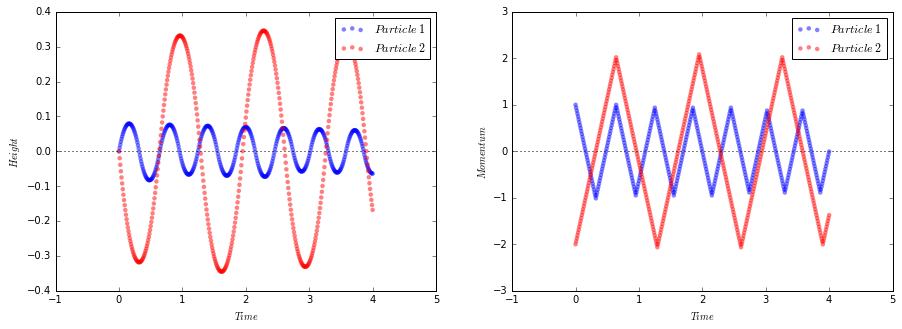

In [8]:
# Let's define the plane mass density
sigma = 1.0

# Let's define the particle initial conditions
z1  = 0.0
vz1 = 1.0
z2  = 0.0
vz2 = -2.0

q0 = np.array([[0.0,0.0,z1], [0.0,0.0,z2]])
p0 = np.array([[0.0,0.0,vz1], [0.0,0.0,vz2]])

# Let's define the integration parameters
h = 0.01
nsteps = 400
times = np.array(range(nsteps+1)) * h

# Integrates the movement
q,p = leapfrog_dkd_integrate(q0, p0, h, nsteps, plane_acceleration, sigma)

# Extracts the information I am interested in:
z  = q[:,0:nsteps+1]*0.0
pz = p[:,0:nsteps+1]*0.0
for step in range(0,nsteps+1):
    index = 3*step
    z[:,step]  = q[:,index+2]
    pz[:,step] = p[:,index+2]

# Print resuts
fig = plt.figure(figsize=(15,5))
# Positions
ax = fig.add_subplot(121)
ax.scatter(times,z[0,:],c='b',edgecolor='None',alpha=0.5,label='$Particle\,1$')
ax.scatter(times,z[1,:],c='r',edgecolor='None',alpha=0.5,label='$Particle\,2$')
ax.axhline(0.0,c='k',linestyle=':')
ax.legend()
ax.set_xlabel('$Time$')
ax.set_ylabel('$Height$')
# Velocities
ax = fig.add_subplot(122)
ax.scatter(times,pz[0,:],c='b',edgecolor='None',alpha=0.5,label='$Particle\,1$')
ax.scatter(times,pz[1,:],c='r',edgecolor='None',alpha=0.5,label='$Particle\,2$')
ax.axhline(0.0,c='k',linestyle=':')
ax.legend()
ax.set_xlabel('$Time$')
ax.set_ylabel('$Momentum$')
plt.show()

A few comments on this toy model:
- The star may seem to oscillate in a harmonic way bewteen 2 extreme positions, but the trayectory is not a sinusoidal but a set of parabolas, remember the analytic solution
- The velocity is not differentiable at the peaks, when the star traverses the galactic plane --> discontinuity
- The star spends most of its time near the points the furtherst of the galactic plane
- The higher the z velocity on the plane, the further the star goes (the thicker the plane appears)

Now, let's look at some "disks":
- We start with a set of particles randomly distributed in 1-D (e.g. x)
- We kick them with random velocities, following a distribution
- We wait for a while so that the phases mix
- We take a snapshot of how the disk looks like

In [9]:
def disk_initial_pos(num_part):
    '''Spreads n particles in random positions between 0 and 1'''
    import numpy as np
    q0 = np.zeros((num_part,3))
    q0[:,0] = np.random.random(num_part)
    return q0
def disk_initial_mom(num_part,v_mean):
    '''Spreads n particles in random velocities following a gaussian distribution'''
    p0  = np.zeros((num_part,3))
    #cos = np.zeros((num_part))
    p0[:,2] = np.random.normal(loc=0.0, scale=v_mean,size=num_part)
    #cos[:]  = np.cos(np.random.uniform(low=-1.0,high=1.0,size=num_part))
    #p0[:,2] *= cos
    return p0
def snap_disk(num_part, sigma, v_mean):
    # Generate random initial conditions for the positions of the disk
    q0 = disk_initial_pos(num_part)
    p0 = disk_initial_mom(num_part, v_mean)
    # Evolve the system for a while
    h      = 0.1
    nsteps = 100
    q,p = leapfrog_dkd_integrate(q0, p0, h, nsteps, plane_acceleration, sigma)
    # I am only interested in the positions and velocity distributions at the end
    x  = q[:,3*nsteps]
    z  = q[:,3*nsteps+2]
    vz = p[:,3*nsteps+2]
    
    return x,z,vz

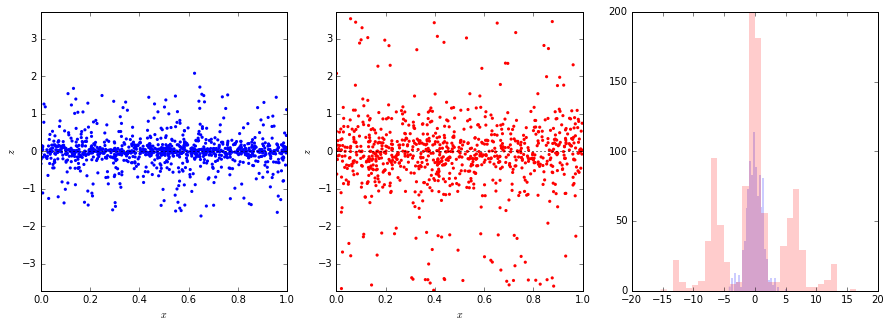

In [10]:
# Now let's compare 2 disks
n = 1000
x1, z1, vz1 = snap_disk(num_part=n, sigma=1.0, v_mean=1.0)
x2, z2, vz2 = snap_disk(num_part=n, sigma=5.0, v_mean=1.0)

# Plot
zlim = np.max((np.max(z1),np.max(z2))) / 2.0
fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot(131)
ax.scatter(x1,z1,c='b',edgecolor='None',s=10.0)
ax.axhline(0.0,c='k',linestyle=':')
ax.set_xlim(0.0,1.0)
ax.set_ylim(-zlim,zlim)
ax.set_xlabel('$x$')
ax.set_ylabel('$z$')

ax = fig.add_subplot(132)
ax.scatter(x2,z2,c='r',edgecolor='None',s=10.0)
ax.axhline(0.0,c='k',linestyle=':')
ax.set_xlim(0.0,1.0)
ax.set_ylim(-zlim,zlim)
ax.set_xlabel('$x$')
ax.set_ylabel('$z$')

ax = fig.add_subplot(133)
hist = ax.hist(vz1,bins=int(np.sqrt(n)),color='b',edgecolor='None',alpha=0.2)
hist = ax.hist(vz2,bins=int(np.sqrt(n)),color='r',edgecolor='None',alpha=0.2)



### 1.1.2 Galaxy cluster dynamics

Oort's work did not cause a big stir at the time, but soon later (1933), Fritz Zwicky found evidence that there was a big fraction of dark energy in the universe by looking at a different place: the Coma Cluster:

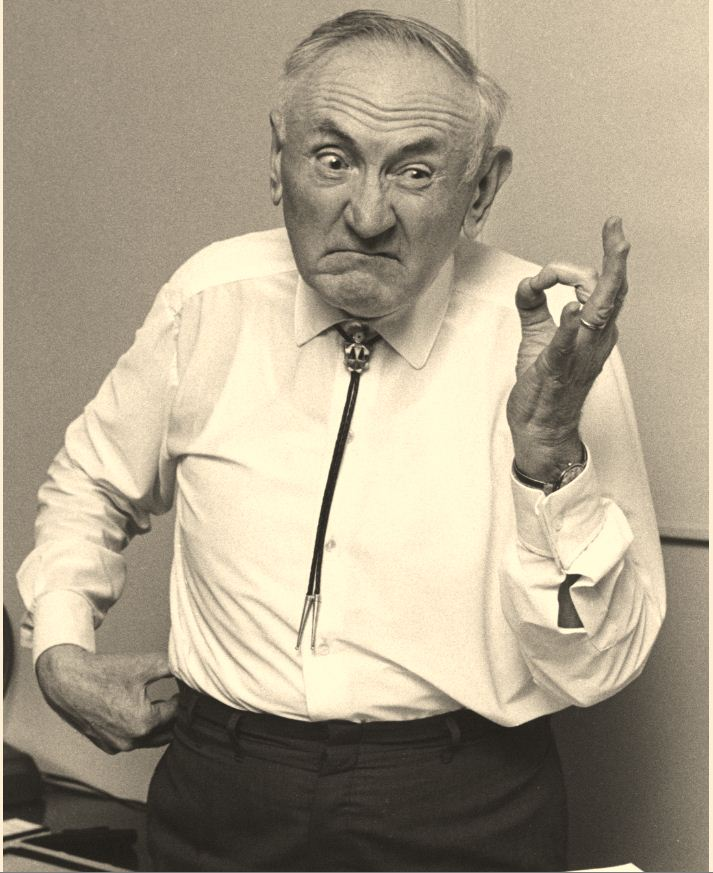

In [11]:
Image(filename="Zwicky_2.jpg")

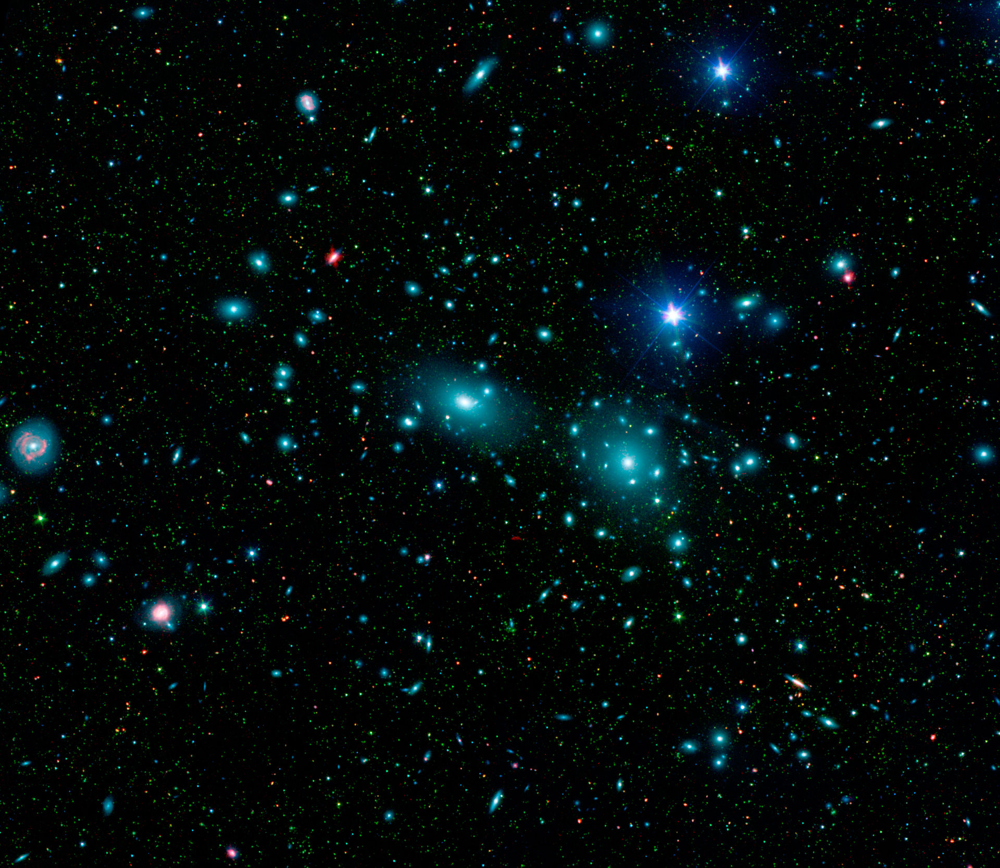

In [12]:
Image(filename="coma_cluster.jpg")

Zwicky did something similar with the galaxies in this cluster to what Oort had done to the stars in the solar neighborhood. It measured their velocities, and then tried to infer what was the mass enclosed in the cluster (remember, the more mass, the higher the velocities, or hotter the system will be). 

Most specifically, he made use of the Virial theorem, which relates the (time) average of the total kinetic energy of a system (set of particles) with the (time) average of the total potential energy, assuming that the only interactions that keep the system bound can be derived from a potential (as is the case for gravity):

$$\frac{GM}{R}\approx <v^2>$$

This relation (within a factor of order unity) gives the total, gravitational mass of the cluster. The visible mass can be estimated from the luminosity of the galaxies, Zwicky found that 

$$M_{luminous}\ll M_{total}$$

This exercise relies on a set of assumptions:

1. Galaxy clusters are graviationally bound sytems, not just random lucky associations of close galaxies:
    - If they were not, given their velocities, they would disperse rather fast (their crossing time is $t_{cr}\approx 10^9$ years. We would be just lucky to see them.
    - If galaxies are placed randomnly in space, the statistics of overdensities would follow a Poisson distribution, we should not see so many dense clusters.
2. They are roughly in equilibrium. This requires that the galaxies that are part of them should have done several orbits around the cluster (almost). This assumption is based mostly on morphology, since most of them show an approximate spherical symmetry.

At the time Zwicky did his analysis, he could only estimate the contribution of stars to the mass, we can now also measure other contributions, how?

If there is also gas not bound to the galaxies, we can estimate its average kinetic energy from the same virial theorem. That calculation tells that the gas is very hot, so hot that most of its energy is emitted in X-rays. When we observe the same cluster in X-rays, we do observe a large emission

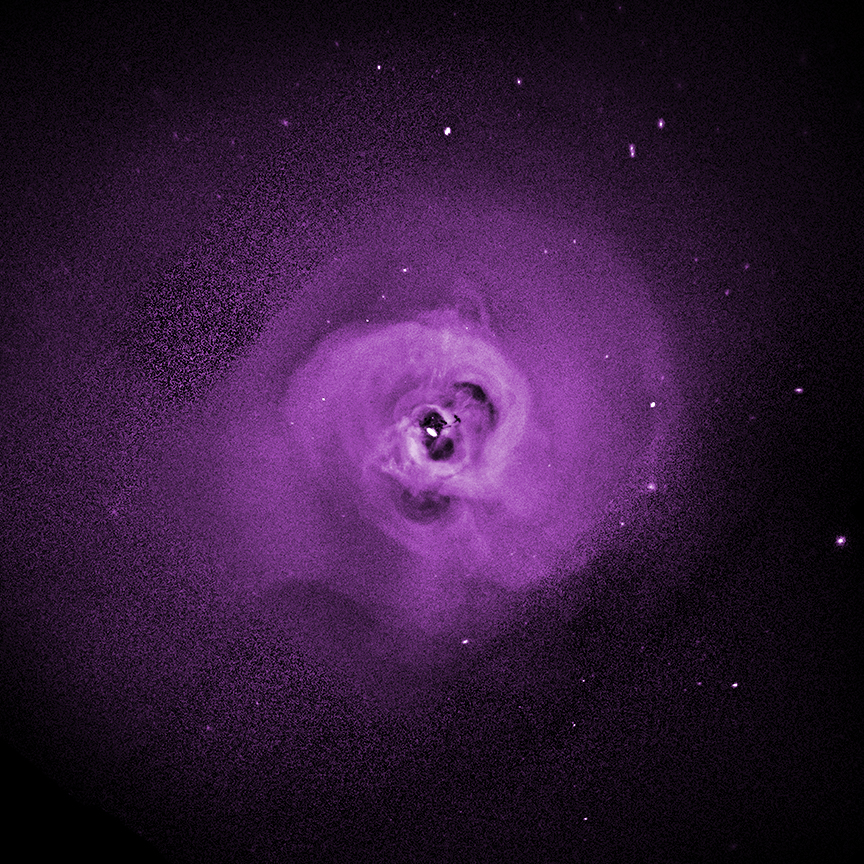

In [13]:
Image(filename="perseus.jpg")

Nevertheless, even accounting for the gas mass responsible for the X-Ray emission, which is larger than the one encompased in the galaxies, we're still short of the dynamical mass estimates by ~ 1 order of magnitude. By now, we have observed these clusters in essentially every wavelenght possible, from radio to gamma-rays, and are confident we have measured the presence of any regular form of matter that interacts with light. We're still short

### 1.1.3 Disk galaxies rotation curves

If we could measure the rotational speed of stars around the centers of the galaxies, we would expect it to decrease with their distance to it. Specifically, if:
- The orbits are circular
- The speeds are non-relativistic

$$\vec{a_c} = \vec{g}$$

$$\frac{v^2}{R}= \frac{GM(R)}{R^2}$$

and if most of the mass of the galaxy is within the orbit of the star

$$v \propto \frac{1}{\sqrt{R}}$$

In the seventies, Vera Rubin started measuring the rotation curve of galaxies, i.e. how the rotation velocity of stars changes with their distance for the center of the galaxy. She started with M31.

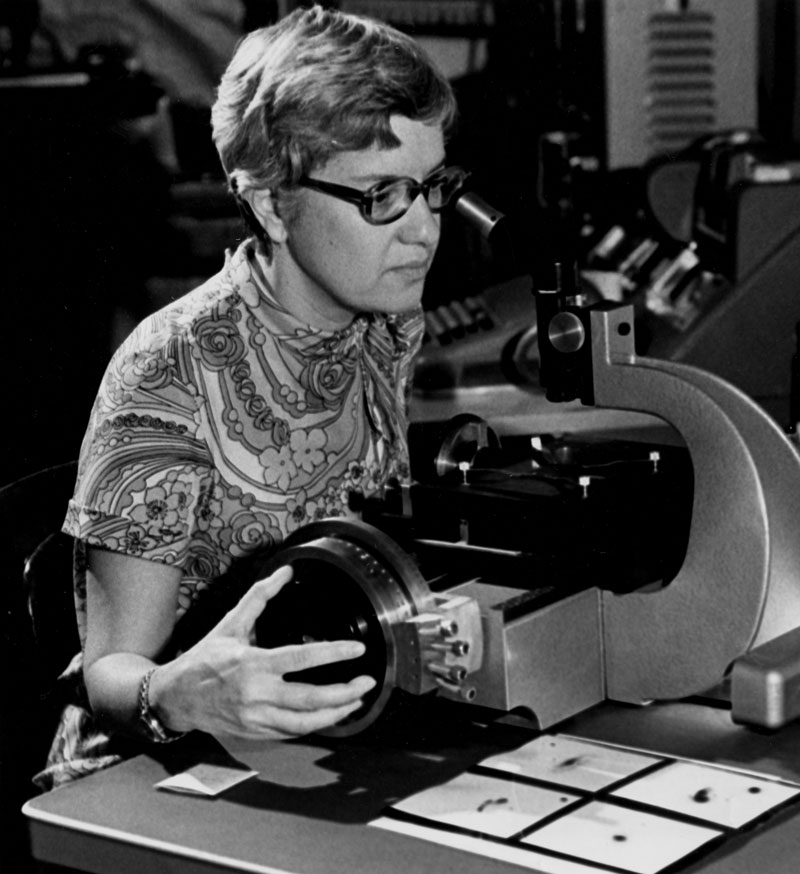

In [14]:
Image(filename="vera_rubin.jpg")

And what they found was: (see paper)

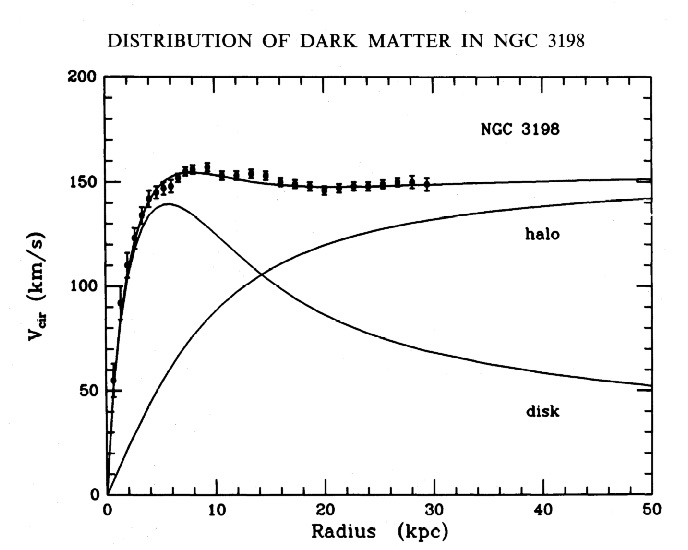

In [15]:
# Self-consisten models allow to infer the amount of dark matter needed
Image(filename="rotation.jpg")

And we have extended the measurement far from the center using the 21 cm line

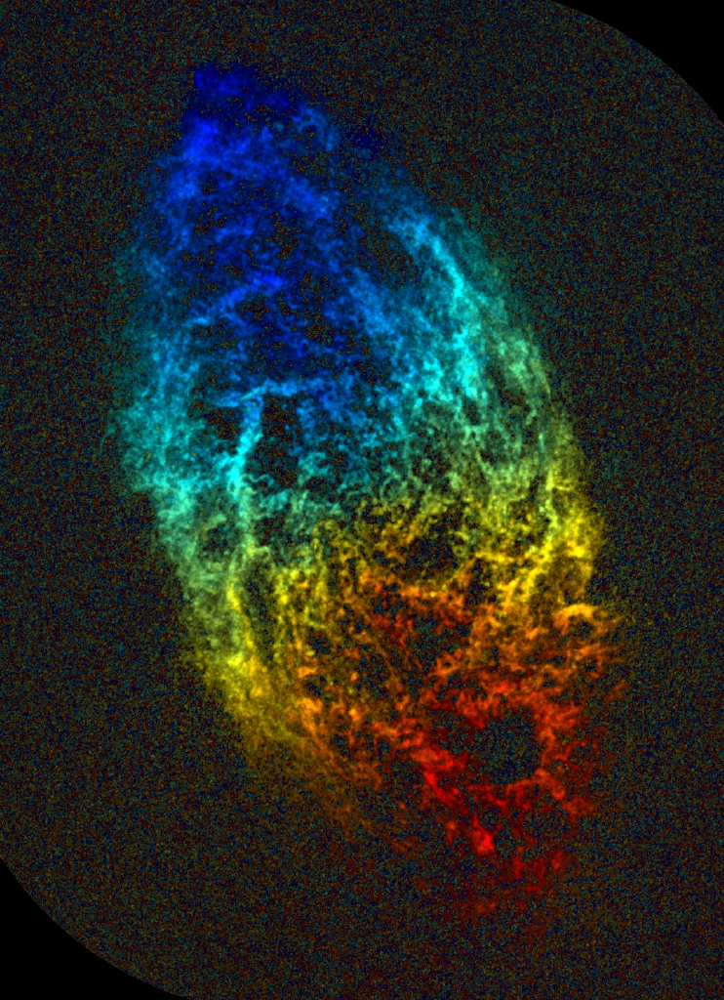

In [16]:
Image(filename="m33doppler.jpg")

### 1.1.4 Gravitational lensing

Remember, from our GR lectures, light follows null-geodesics. Therefore, mass, by changing the curvature of space-time, changes the path of light, in an analogous was as lenses do it by using different indexes of refraction and material thickness.

The deflection angle by a point mass is given by:

$$\alpha=\frac{4GM_L}{c^2b}$$

and the observed deflection, known as Einstein radius, depends also on the relative position of object, lens, and observer:

$$\theta_E = \left(\frac{4GM_L}{c^2}\frac{d_{LS}}{d_L d_S} \right)$$

In [17]:
print "Go to NASA simulator tab"

Go to NASA simulator tab


The presence of mass, can then distort the images of background sources, and even generate multiple images

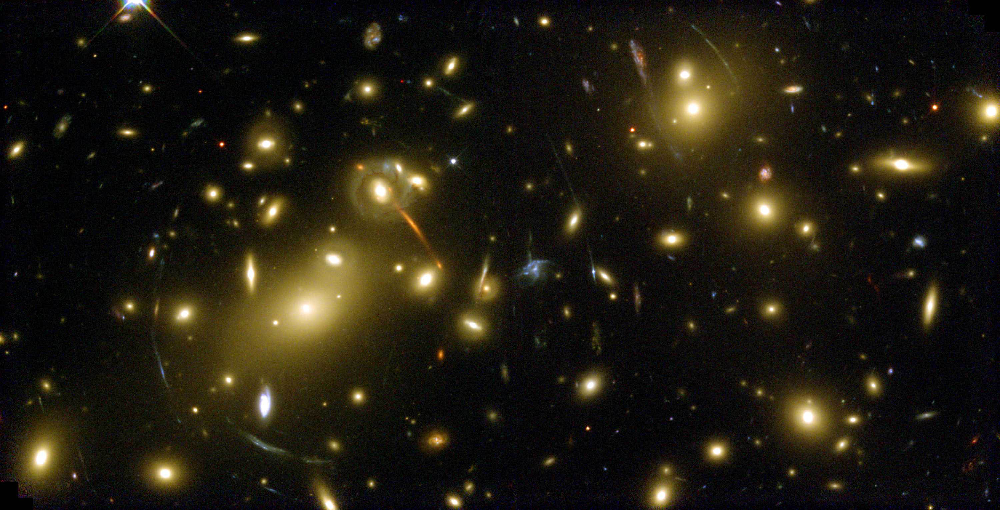

In [18]:
Image(filename="abell2218.jpg")

Since this effect is independent of the nature or dynamic state of the matter, it is a very powerful probe to estimate the matter content of galaxy clusters

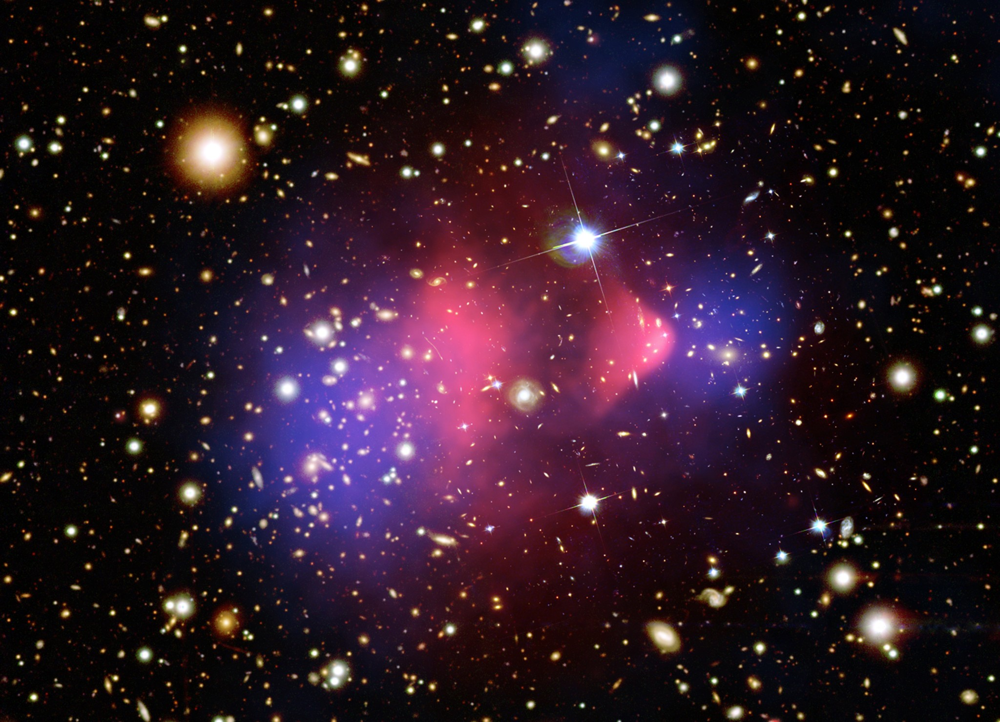

In [19]:
Image(filename="bulletcluster_comp_f2048.jpg")

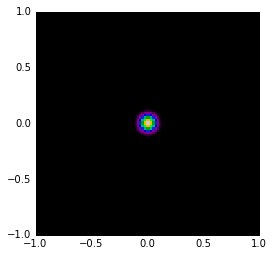

In [20]:
global x,y,galaxy_properties,gal
@interact(n=(10,400,50),sigma=(.01,.5,.01),xcen=(-1,1,.1),ycen=(-1,1,.1),axratio=(.2,4,.1),posangle=(0,180,5))
def set_number_of_points(n=100,sigma=0.1,xcen=0,ycen=0,axratio=1.0,posangle=30):
    """Set up a mock galaxy with the input parameters.
        n:              sets the number of points in each direction.
        sigma:          sets the 'width' of the galaxy.
        xcen & ycen:    set the center of the galaxy.
        axratio:        sets the ellipticity of the galaxy.
        posangle:       sets the orientation of the galaxy. """
    
    global x,y,galaxy_properties,gal
    (x,y) = dm.load_grid(n)
    galaxy_properties={'peak':1,'sigma':sigma,'xcen':xcen,'ycen':ycen,'axratio':axratio,'posangle':posangle}
    gal = dm.create_galaxy(x,y,**galaxy_properties)
    plt.imshow(gal,**imshow_kwargs)

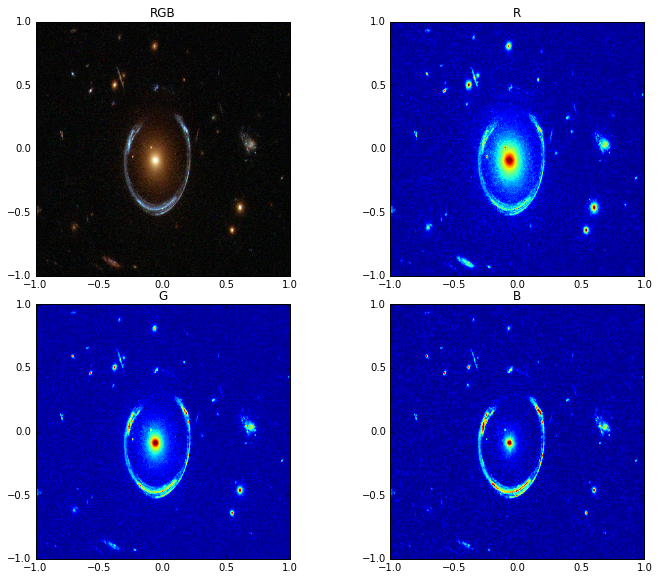

In [21]:
images=dm.load_images()
@interact(Galaxy={'Galaxy 1':'lens1.jpg','Galaxy 2':'lens2.jpg', 'Galaxy 3':'lens3.jpg','Galaxy 4':'lens4.jpg'})
def view_real_galaxy(Galaxy):
    """Display the HST image in four plots.
        The first shows the composite image 
        and the other plots show the image in the Red, Blue, and Green bands."""

    plt.close()
    im2 = imread(Galaxy)
    fig, ((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2,figsize=(10,8))
    plt.tight_layout()
    ax1.imshow(im2,extent=imshow_kwargs['extent'])
    ax2.imshow(im2[:,:,0],extent=imshow_kwargs['extent'])
    ax3.imshow(im2[:,:,1],extent=imshow_kwargs['extent'])
    ax4.imshow(im2[:,:,2],extent=imshow_kwargs['extent'])
    ax2.set_title('R')
    ax3.set_title('G')
    ax4.set_title('B')
    ax1.set_title('RGB')
    plt.show()

{'xcen': 0.0, 'axratio': 1.0, 'peak': 1, 'posangle': 30, 'sigma': 0.1, 'ycen': 0.0}


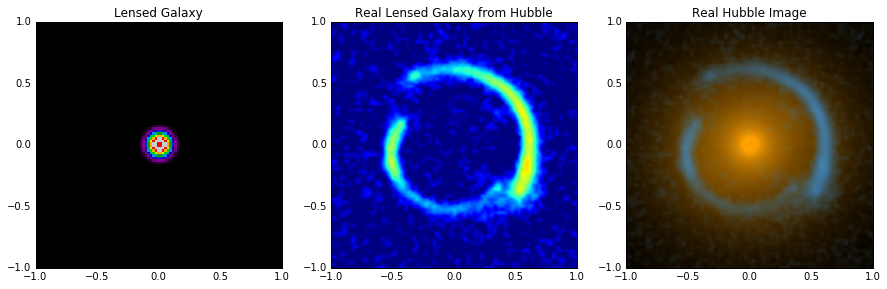

In [22]:
def start_activity():
    """ Set up the activity by setting up the plotting environment 
            and calling the interactive function."""
    global gal
    fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,8)) 
    ax1.set_title('Lensed Galaxy')
    ax2.set_title('Real Lensed Galaxy from Hubble')
    ax3.set_title('Real Hubble Image')
    im_m = ax2.imshow(images['Exercise 1'][0],extent=imshow_kwargs['extent'])
    im_r = ax3.imshow(images['Exercise 1'][1],extent=imshow_kwargs['extent'])
    im_l = ax1.imshow(gal,**imshow_kwargs)
    cbox = Checkbox(description='Save To File',value=False)
    disp.display(cbox)
    @interact(Image=images,FileName='lens4.jpg',DarkMatterSize=(0,3,.1), \
              DarkMatterXCenter=(-1,1,.01),DarkMatterYCenter=(-1,1,.01),DarkMatterAxisRatio=(.01,4,.03),\
              DarkMatterPositionAngle=(0,180,5))
    #@interact(Image=images,FileName=TextWidget(value='My File Name'),DarkMatterSize=(0,3,.1), \
    #          DarkMatterXCenter=(-1,1,.01),DarkMatterYCenter=(-1,1,.01),DarkMatterAxisRatio=(.01,4,.03),\
    #          DarkMatterPositionAngle=(0,180,5))
    def plot_galaxy(FileName='My File Name',Image=images,DarkMatterSize=.1,DarkMatterXCenter=0,\
                    DarkMatterYCenter=0,DarkMatterAxisRatio=1,DarkMatterPositionAngle=0):
        global x,y,galaxy_properties,gal
        print galaxy_properties
       
        plt.close();
        xl,yl = dm.compute_deflection(x,y,Mass=DarkMatterSize,xcen=DarkMatterXCenter, \
                                      ycen=DarkMatterYCenter,axratio=DarkMatterAxisRatio,\
                                      posangle=DarkMatterPositionAngle)
        gal = dm.create_galaxy(x-xl,y-yl,**galaxy_properties)
 
        im_l.set_data(gal)
        im_m.set_data(Image[0])
        im_r.set_data(Image[1])
  
        disp.display(fig)       
        if cbox.value:
            if FileName == '':
                FileName = 'Untitled'
            FileName.strip('')
            FileName += '.jpg'
            print 'Saving File in ' + FileName
            fig.savefig(FileName)
            cbox.value = False
            
start_activity()  

### 1.1.5 Structure growth

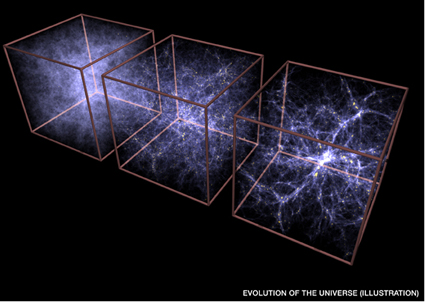

In [23]:
Image(filename="lss.jpg")

If there was no DM:
- Perturbations are erased from the baryon plasma by photons until recombination
- After recombination, perturbations can grow as $\propto t^{2/3}$
- Not enough time to get the level of structure we see today!!!

DM helps:

- DM perturbations can grow as soon as DM decouples from photons, much earlier than recombination
- At decoupling, baryons can fall into DM potential wells, structure forms faster

### 1.1.6 Cosmological information

We can fit different models, with and without DM, to try to generate "mock" CMBs that we can compare with reality. Turns out we cannot fit the CMB power spectrum well without adding DM to our models.

For instance the position of the first peak is very sensitive to the total curvature of the universe

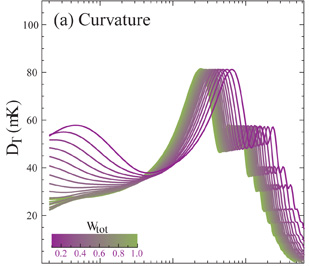

In [24]:
Image(filename="ps_curvature.png")

http://space.mit.edu/home/tegmark/movies.html

From this we know that $\Omega(t_0)\approx 1.0$

From other measurements (see later), we get that the universe is expanding and that requires something that behaves as a cosmological constant with value $\Omega_{\Lambda} (t_0) \approx 0.74$

This yields a matter density of $\Omega_m(t_0)\approx 0.26$, much larger than what we can account observationally

## 1.2 The nature of Dark Matter

### 1.2.1 Baryonic (regular) dark matter

In principle, we could think of dark matter as just regular matter, in the form of cold objects (e.g. planets, dust...) floating in space and difficult to detect. It is not easy, since dust obscures light, and we should be able to measure that effect, it is difficult to find models that justify forming so much mass in the form of planet as stars collapse....

Nowadays we believe most of this dark matter cannot be baryonic, and the 2 main evidences we have are...

... the CMB! Again, the CMB statistical properties are sensitive to the density of baryons. For instance, the height of the first acoustic peak is very sensitive to it. When we fit our data to our observations we find $\Omega_b(t_0)\approx 0.046$

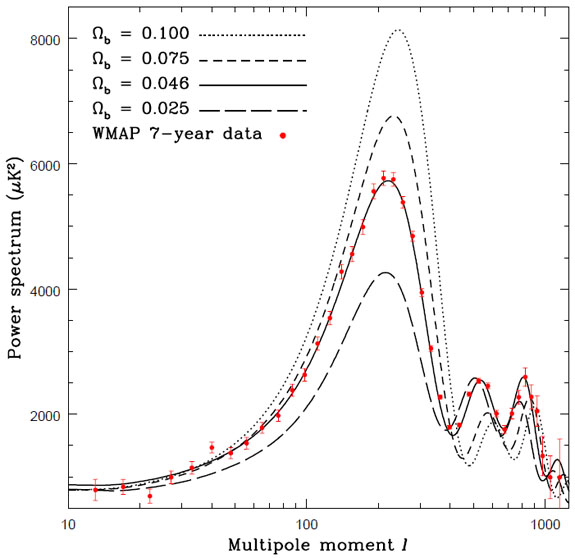

In [25]:
Image(filename="ps_baryons.jpg")

Another evidence comes from Big Bang Nucleosynthesis. The elements formed, and their proportions, are very sensitive to the baryon density. 

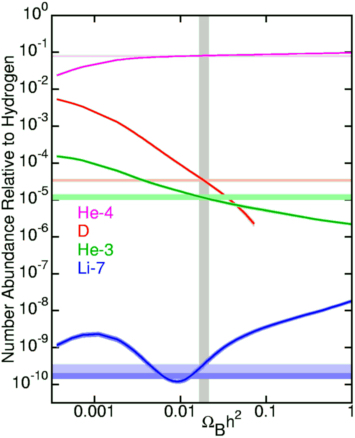

In [26]:
Image(filename="BBNS-sm.jpg")

How do we measure the abundance of D?

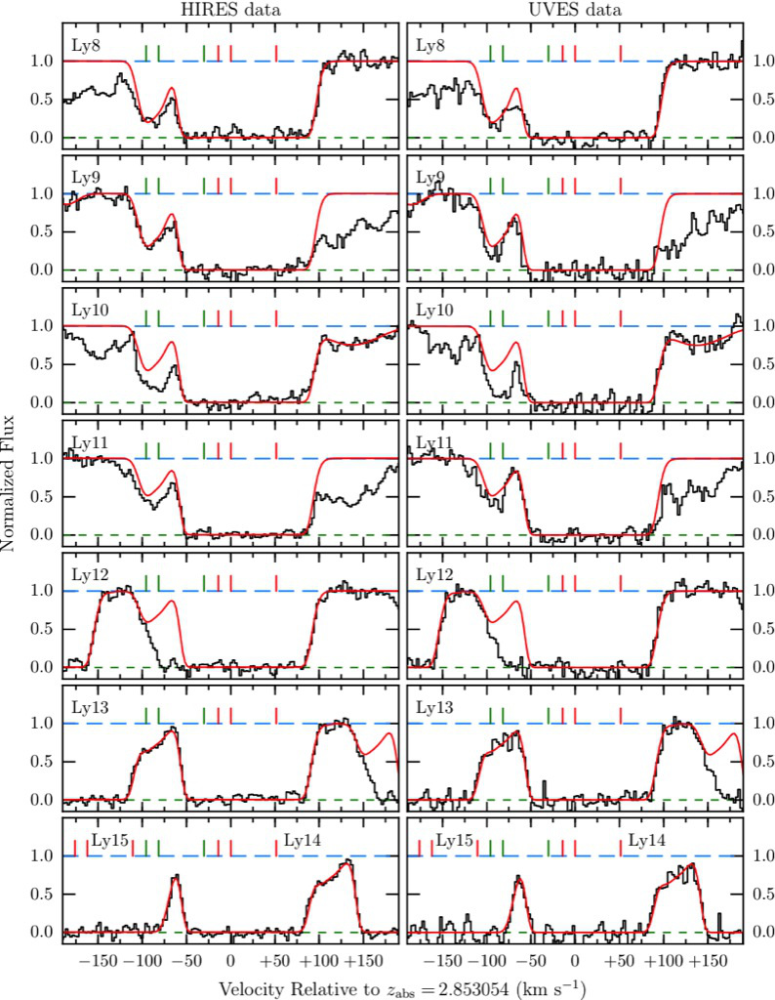

In [27]:
Image(filename="deuterium.jpg")

### 1.2.2 Primordial BHs

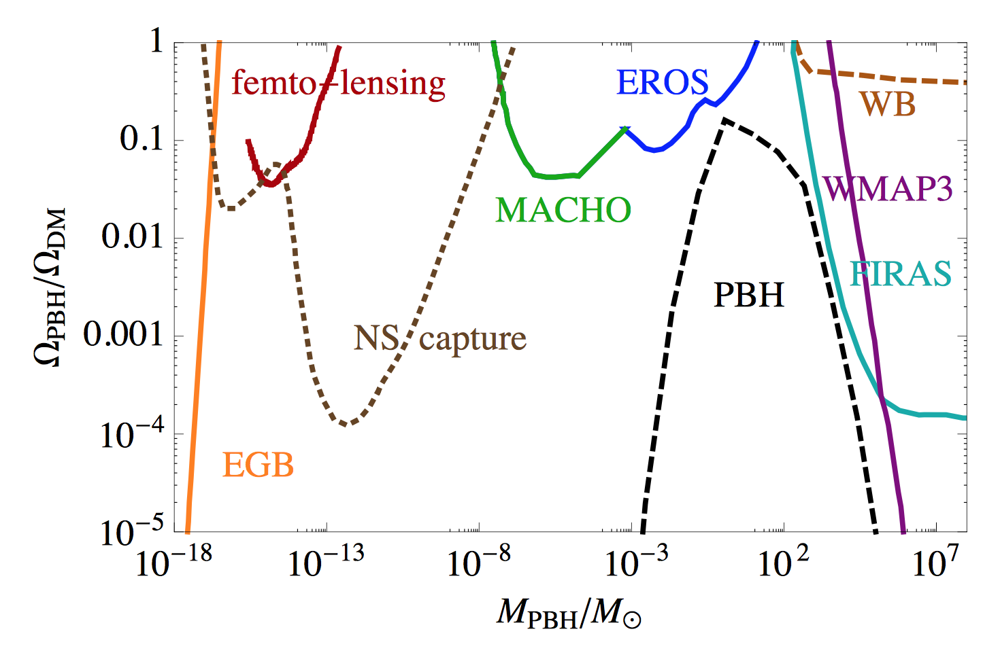

In [28]:
Image(filename="PBHs.png")

### 1.2.3 MACHO's

Regardless of the DM composition, one can also ask the question of whether it is present in the form of compact objects, or diffuse matter, the same way we have baryonic compact objects (stars, planets, ...) and diffuse gas.

Massive Compact (Halo) Objects (MACHOs), being compact, should reach a relatively high density, and can therefore lens light in a very intense way.



In [30]:
import io
import base64
from IPython.display import HTML

video = io.open('point.avi', 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" controls>
                <source src="data:video/avi;base64,{0}" type="video/avi" />
             </video>'''.format(encoded.decode('ascii')))

Most efforst to detect them through observational campaigns. These also help limit the population of primordial black holes

### 1.2.3 WIMPS

Alternatively, DM can be in difuse form, a gas of some kind of particle. This particle needs to satisfy certain characteristics:

1. It cannot interact through EM --> electrically neutral
2. Stable in cosmological timescales (e.g. no neutrons)
3. Massive enough to be non-relativistic (cold) so that structure formation happens bottom up (and the matter power spectrum matches observations) (e.g. no neutrinos)

We have no particle with these characteristics in our standard model. So new particles have been proposed:

- Weakly Interacting Massive Particles (WIMPS)
- Axions
- ?

Of course there could be more than one particle (Randall), and new "dark" interactions, but since we have yet to find one --> Occam's razor

Some extensions of the standard model predict particles that could satisfy those conditions. Some could interact with themselves and generate photons --> direct detection experiments:
- On the lab
- Astrophysical

### 1.2.4 Changing our description of gravity

MOND: gravity seems to work at small scales (solar system) but not at large (galactic) scales, where the intensity of the gravity objects see seems larger than what would be expected from the amount of mass. Put a floor to the potential, so that when it is very weak, it is larger than the $\propto \frac{1}{r}$ Newtonian version.

- It can explain the rotation curves of the galaxies
- There is a version of the theory within a GR framework

But

- New parameters that need to be tuned to get the rotation curves
- Cannot explain other phenomena (e.g. bullet cluster)
- Not well motivated (origin of that floor?)

# 2. Dark Energy

## 2.1 Evidence for the existence of Dark Energy

The strongest evidence we have from the existence of Dark Enery is related to the expansion history of the universe. That has implications in terms of the geometry and distances we can measure to cosmic objects

### 2.1.1 The accelerating universe

If we know the luminosity of an object, and measure its brightness, we know its "luminosity distance":

$$D_L\equiv\ \sqrt{\frac{L}{4\pi S}}$$

In a expanding universe, this distance depends on redshift and cosmological parameters:

$$D_L = (1+z) \frac{c}{H_0}\int_0^z \frac{dz'}{\sqrt{\Omega_m(1+z')^3+\Omega_R(1+z')^2+\Omega_\Lambda}}$$

If we can measure the brightness of sources with known luminosity (standard candles) and their redshift, we can then infer cosmology

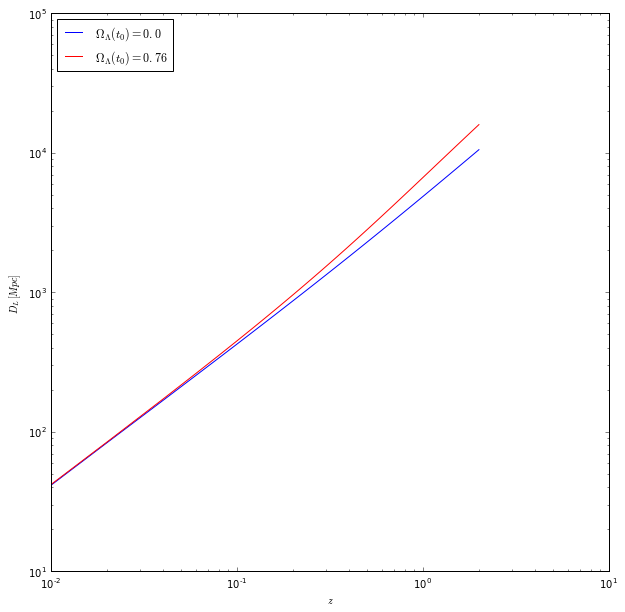

In [39]:
# Let's compare some cosmologies
Ol_1 = 0.0
Ol_2 = 0.76

cosmo1 = FlatLambdaCDM(H0=72.0,Om0=1.0-Ol_1)
cosmo2 = FlatLambdaCDM(H0=72.0,Om0=1.0-Ol_2)

z = np.linspace(0,2.0,100)
dl_1 = cosmo1.luminosity_distance(z)
dl_2 = cosmo2.luminosity_distance(z)

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111)
ax.plot(z,dl_1,'b-',label='$\Omega_\Lambda (t_0) = %s$'%(Ol_1))
ax.plot(z,dl_2,'r-',label='$\Omega_\Lambda (t_0) = %s$'%(Ol_2))
ax.set_xscale('log')
ax.set_yscale('log')
ax.legend(loc=2)
ax.set_xlabel('$z$')
ax.set_ylabel('$D_L\,[Mpc]$')

Even at moderate redshifts, the difference is noticeable. In the nineties (97) different teams published their independent efforts to plot the above graph using Type Ia supernovae

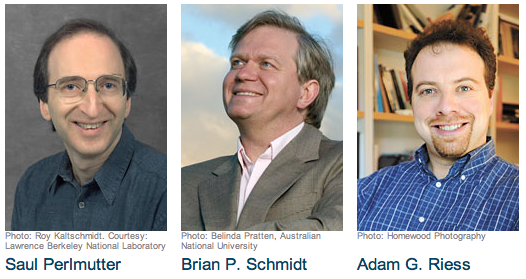

In [40]:
Image(filename="physics_nobel_2011.png")

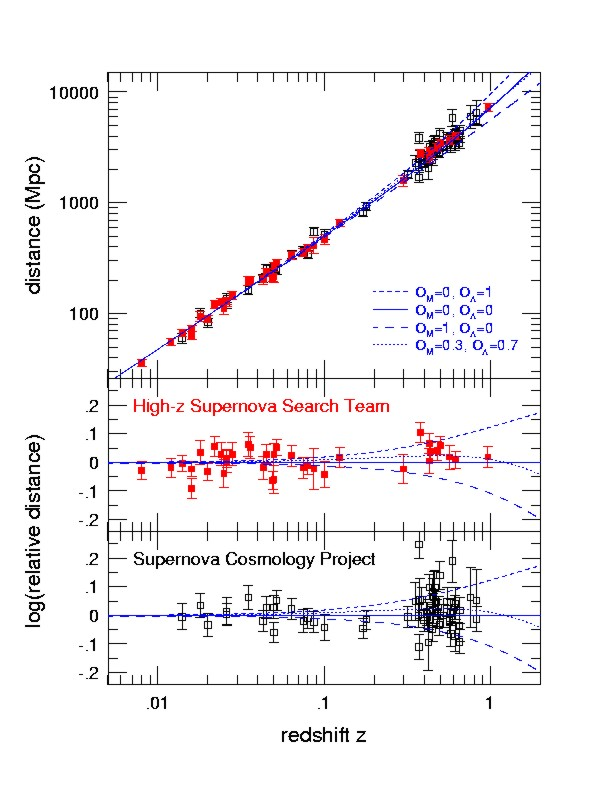

In [32]:
Image(filename="supernova.jpg")

The universe is accelerating!!!!

And, then there is the CMB. Again, the best fitting results correspond to the value of $\Omega_\Lambda (t_0)$ found using supernova measurements

### 2.1.2 Similar excersise using standard rulers instead of standard candles

Another way to probe the expansion history of the universe is using the angular diameter distance. If we know the physical size of an object, and we measure the angle it subtends on the sky, we can then infer its angular distance:

$D_A=\frac{L}{\theta}=\frac{D_M}{1+z}$

with $D_M$ the transverse comoving distance, which for a flat universe is the same as the comoving distance, but not for curved space-times:

$D_M = \begin{cases}
        D_H \frac{1}{\sqrt{\Omega_R}}\sinh\left[\sqrt{\Omega_R} \frac{D_C}{D_H} \right] & for \, \Omega_R > 0 \\
        D_C  & for \, \Omega_M = 0 \\
        D_H \frac{1}{\sqrt{\Omega_R}}\sin\left[\sqrt{\Omega_R} \frac{D_C}{D_H} \right] & for \, \Omega_R < 0
        \end{cases}$

with

$D_C = D_H \int_0^z \frac{dz'}{E(z')}$ and $D_H = \frac{c}{H_0}$

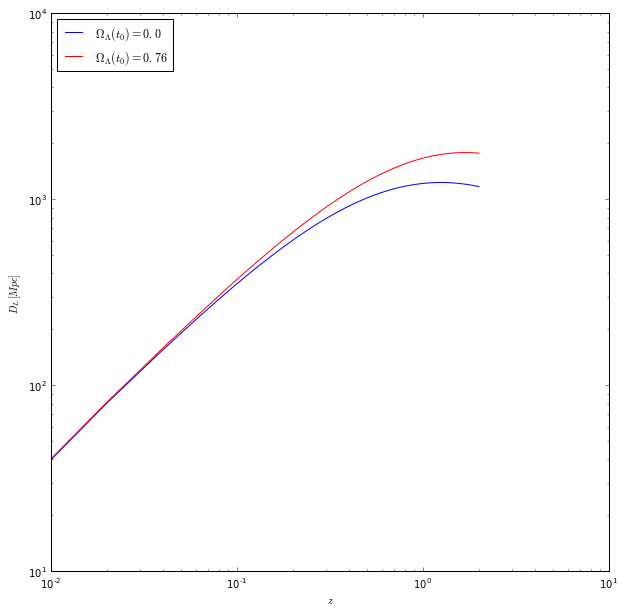

In [41]:
# Let's compare some cosmologies
Ol_1 = 0.0
Ol_2 = 0.76

cosmo1 = FlatLambdaCDM(H0=72.0,Om0=1.0-Ol_1)
cosmo2 = FlatLambdaCDM(H0=72.0,Om0=1.0-Ol_2)

z = np.linspace(0,2.0,100)
dl_1 = cosmo1.angular_diameter_distance(z)
dl_2 = cosmo2.angular_diameter_distance(z)

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111)
ax.plot(z,dl_1,'b-',label='$\Omega_\Lambda (t_0) = %s$'%(Ol_1))
ax.plot(z,dl_2,'r-',label='$\Omega_\Lambda (t_0) = %s$'%(Ol_2))
ax.set_xscale('log')
ax.set_yscale('log')
ax.legend(loc=2)
ax.set_xlabel('$z$')
ax.set_ylabel('$D_L\,[Mpc]$')

The first objects you can think to apply this method could be galaxies. The problem is that there is a large spread in galaxy sizes, and galaxies evolve in time, so there is a redshift-dependence in the average galaxy size that can affect any inference

Luckily, the early universe physics provides such a standard candle. Baryonic acoustic oscillations imprint preferential clustering on a specific scale that can be measured with high precision on the CMB -since the redshift to it is well known-. This scale is large enough that its evolution is well described by the linear growth of perturbations. If we measure it at a later time, for instance on galaxy surveys (like BOSS), then we can use it as a standard ruler to measure the distance-redshift relationship.

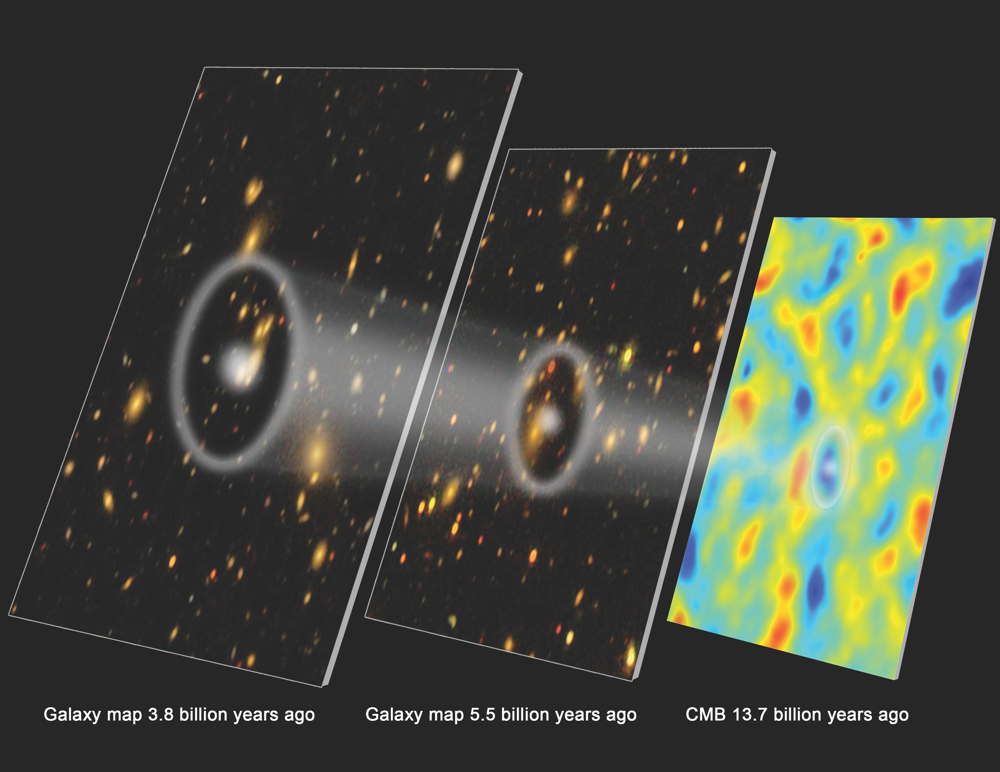

In [37]:
Image(filename="sdss_bao.png")

### 2.1.3 CMB

Of course, since the dark energy density - or $\Lambda$ - is a parameter in $\Lambda$CDM, we can fit for it in the CMB power spectrum, and doing so favours a value that is consistent with that of the other expansion history probes

http://space.mit.edu/home/tegmark/movies.html

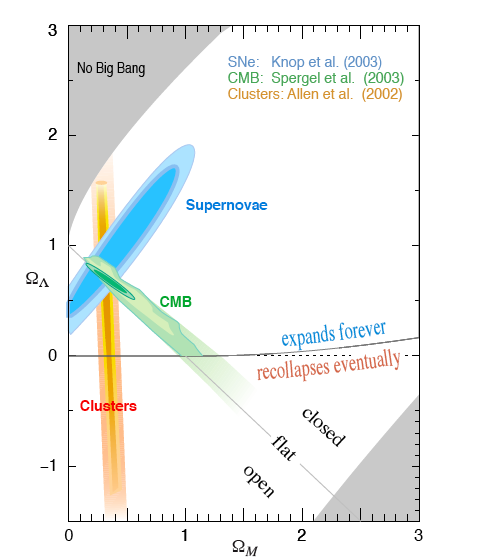

In [38]:
Image(filename='DE.png')

## 2.2 The nature of Dark Energy

Essentially, since DE manifests itself through an accelerated expansion, it's presence modifies the Friedmann's equation. Then, you can modify the rhs, by adding an additional component, or the lhs, by changing the Einstein-Hilbert action.

Since puting a term on the rhs or the lhs is just a matter of preference, measurements of the expansion history by themselves cannot distinguish between both scenarios. Luckily, changes to the lhs, affect to any gravitational interactions, and other probes like the growth of structure, would be able to tell between both scenarios.

### 2.2.1 RHS: A good old cosmological constant

A short discusion on the origin of the cosmological constant, from Einstein's "error", to the age of the universe problem, to the convergence towards the concordance model

"The biggest disagreement between theory and experiment" from $\rho_{vacuum} \approx 10^{133} eV/m^3$ (quantum field theories) to $\rho_\Lambda \approx 10^9 eV/m^3$ from the expansion and CMB measurements !!!!!

Coincidence problem: it is only recently that the density of DE is of order unity, if it is a cosmological contant, the expansion will become exponential. Lucky coincidence, anthropic principle?

### 2.2.2 RHS: Quintessence

A 5th force that behaves like a cosmological constant. In this case its behavior can change with cosmic time, its energy density not being constant anymore.

### 2.2.3 LHS: DGP model

Gravity is a 4D force that on small (cosmologically) scales behaves as a 3D force that mimics GR. The bending of the 3D brane we live in would look like an accelerated expansion.

It seems disfavored by current measures of growth of structure.

### RHS: Modified gravity

Many models, all need to make the gravity weaker on very large scales. Some acomplish that by giving some mass to the graviton, thus introducing an effective distance for gravity. Others introduce many dimensions, through some of whicy gravity "leaks". In general, highly speculative at this point.